# PRCP-1000-ProtugeseBank Portugese Bank Marketing Project

  The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe to a term deposit (variable y).

## Problem Statement

#### 1:-Prepare a complete data analysis report on the given data.
#### 2:-Create a predictive model which will help the bank marketing team to know which customer will buy the product.
#### 3:-Suggestions to the Bank market team to make customers buy the product.


# Import Library 
* which we help to perform some task

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Upload a dataset 
dataa=pd.read_csv('bank-additional-full.csv')

In [3]:
dataa 

,"age;""job"";""marital"";""education"";""default"";""housing"";""loan"";""contact"";""month"";""day_of_week"";""duration"";""campaign"";""pdays"";""previous"";""poutcome"";""emp.var.rate"";""cons.price.idx"";""cons.conf.idx"";""euribor3m"";""nr.employed"";""y"""
0,"56;""housemaid"";""married"";""basic.4y"";""no"";""no"";..."
1,"57;""services"";""married"";""high.school"";""unknown..."
2,"37;""services"";""married"";""high.school"";""no"";""ye..."
3,"40;""admin."";""married"";""basic.6y"";""no"";""no"";""no..."
4,"56;""services"";""married"";""high.school"";""no"";""no..."
...,...
41183,"73;""retired"";""married"";""professional.course"";""..."
41184,"46;""blue-collar"";""married"";""professional.cours..."
41185,"56;""retired"";""married"";""university.degree"";""no..."
41186,"44;""technician"";""married"";""professional.course..."


 * Our dataset is not in good manner We have re arrange the dataset

In [4]:
dataa.columns # The columns in present in our dataset

Index(['age;"job";"marital";"education";"default";"housing";"loan";"contact";"month";"day_of_week";"duration";"campaign";"pdays";"previous";"poutcome";"emp.var.rate";"cons.price.idx";"cons.conf.idx";"euribor3m";"nr.employed";"y"'], dtype='object')

In [5]:
dataa = dataa['age;"job";"marital";"education";"default";"housing";"loan";"contact";"month";"day_of_week";"duration";"campaign";"pdays";"previous";"poutcome";"emp.var.rate";"cons.price.idx";"cons.conf.idx";"euribor3m";"nr.employed";"y"'].str.split(';', expand=True)

* .str.split(';', expand=True): Here, we are telling the code to split that long string into individual pieces whenever it finds a semicolon (;). The expand=True part means that you want to create new columns for each of these pieces. and before this we select columns only

*  after running this code, our dataset have more columns, and each column contain one of the pieces from the long string. It's a way to organize and separate the information in that column for further analysis or processing.

In [6]:
# here the result
dataa

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,56,"""housemaid""","""married""","""basic.4y""","""no""","""no""","""no""","""telephone""","""may""","""mon""",...,1,999,0,"""nonexistent""",1.1,93.994,-36.4,4.857,5191,"""no"""
1,57,"""services""","""married""","""high.school""","""unknown""","""no""","""no""","""telephone""","""may""","""mon""",...,1,999,0,"""nonexistent""",1.1,93.994,-36.4,4.857,5191,"""no"""
2,37,"""services""","""married""","""high.school""","""no""","""yes""","""no""","""telephone""","""may""","""mon""",...,1,999,0,"""nonexistent""",1.1,93.994,-36.4,4.857,5191,"""no"""
3,40,"""admin.""","""married""","""basic.6y""","""no""","""no""","""no""","""telephone""","""may""","""mon""",...,1,999,0,"""nonexistent""",1.1,93.994,-36.4,4.857,5191,"""no"""
4,56,"""services""","""married""","""high.school""","""no""","""no""","""yes""","""telephone""","""may""","""mon""",...,1,999,0,"""nonexistent""",1.1,93.994,-36.4,4.857,5191,"""no"""
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,"""retired""","""married""","""professional.course""","""no""","""yes""","""no""","""cellular""","""nov""","""fri""",...,1,999,0,"""nonexistent""",-1.1,94.767,-50.8,1.028,4963.6,"""yes"""
41184,46,"""blue-collar""","""married""","""professional.course""","""no""","""no""","""no""","""cellular""","""nov""","""fri""",...,1,999,0,"""nonexistent""",-1.1,94.767,-50.8,1.028,4963.6,"""no"""
41185,56,"""retired""","""married""","""university.degree""","""no""","""yes""","""no""","""cellular""","""nov""","""fri""",...,2,999,0,"""nonexistent""",-1.1,94.767,-50.8,1.028,4963.6,"""no"""
41186,44,"""technician""","""married""","""professional.course""","""no""","""no""","""no""","""cellular""","""nov""","""fri""",...,1,999,0,"""nonexistent""",-1.1,94.767,-50.8,1.028,4963.6,"""yes"""


* Now data in rows and columns but we have to rename the columns therfore columns name in digit

In [7]:
dataa.columns = ["age", "job", "marital", "education", "default", "housing", "loan","contact", "month","day_of_week","duration","campaign","pdays","previous","poutcome","emp.var.rate","cons.price.idx","cons.conf.idx","euribor3m","nr.employed","y"]

* Now we are trying to remove double quotation mark from data

In [8]:
dataa= dataa.apply(lambda x: x.str.replace('"', ''))
# Why we use lambda
# I think we aware from lambda function
#lambda function is used with the apply method to remove double quotes (") from all elements in a dataframe or a series.
# or series object

In [9]:
dataa

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


#### Our dataset is ready in good manner

In [75]:
# Now we are trying to save these to diffrent name file.
dataa.to_csv('bank-addi-full_portuges.csv', index=False)

In [10]:
# Upload the dataset 
data=pd.read_csv('bank-addi-full_portuges.csv')

# Domain Analysis¶
#### we have to work on predict  bank industry problem
#### y : column is a categorical nominal= Y-variable(Target)
 * age: This column represents the age of the individuals or clients in the dataset. It's a numerical variable.
 * job: This column likely represents the occupation or job type of the clients. It's a categorical variable.
 * marital: This column likely represents the marital status of the clients (e.g., married, single, divorced). It's a categorical variable. 
 
  * education: This column likely represents the educational level of the clients (e.g., high school, university, etc.). It's a categorical variable.
  * default: This column may indicate whether the clients have credit in default (e.g., "yes" or "no"). It's a binary categorical variable.
  * housing: This column may indicate whether the clients have a housing loan (e.g., "yes" or "no"). It's a binary categorical variable.
  * loan: This column may indicate whether the clients have a personal loan (e.g., "yes" or "no"). It's a binary categorical variable.
  * contact: This column likely represents the communication type used to contact the clients (e.g., "cellular," "telephone"). It's a categorical variable.
  * month: This column may represent the month of the last contact with the client. It's a categorical variable.
   * day_of_week: This column likely represents the day of the week of the last contact with the client. It's a categorical variable.
   * duration: This column represents the duration of the last contact in seconds. It's a numerical variable. Note that including this variable in predictive models can lead to data leakage, as the duration is typically only known after the outcome is observed.
   * campaign: This column may represent the number of contacts performed during this campaign for the client. It's a numerical variable.
   * pdays: This column likely represents the number of days since the client was last contacted. It's a numerical variable.
   * previous: This column may represent the number of contacts performed before this campaign for the client. It's a numerical variable.
   * poutcome: This column likely represents the outcome of the previous marketing campaign (e.g., "success," "failure," "nonexistent"). It's a categorical variable.
   * emp.var.rate: This column may represent the employment variation rate, which is an economic indicator. It's a numerical variable.
   * cons.price.idx: This column may represent the consumer price index. It's a numerical variable.
   * cons.conf.idx: This column may represent the consumer confidence index. It's a numerical variable.
   * euribor3m: This column may represent the Euribor 3-month rate, which is an interest rate. It's a numerical variable.
    
   
   * nr.employed: This column may represent the number of employees. It's a numerical variable.
   * y: This is the target variable or the outcome variable. It indicates whether the client subscribed to the product or service (e.g., "yes" or "no"). It's a binary categorical variable, often used for classification tasks.


# Again Basics Check

In [11]:
data

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


In [12]:
data.size

864948

In [13]:
data.shape

(41188, 21)

In [14]:
 data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [15]:
 data.ndim

2

In [16]:
data.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [17]:
 data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [18]:
 # fetching numerical columns
num_col=data.select_dtypes(include=["int64","float64"]).columns
num_col

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

In [19]:
 # fetching categorical columns
cat_col=data.select_dtypes(include=["object"])
cat_col.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome', 'y'],
      dtype='object')

In [20]:
# fetching unique value in secepic columns 
print(data['job'].unique())
print(data['marital'].unique())
print(data['nr.employed'].unique())

['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
['married' 'single' 'divorced' 'unknown']
[5191.  5228.1 5195.8 5176.3 5099.1 5076.2 5017.5 5023.5 5008.7 4991.6
 4963.6]


In [21]:
## renaming the target column
data.rename(columns={"nr.employed (nr_employed)":'nr.employed'},inplace=True)

In [22]:
# fetching y column deatail 
data.y

0         no
1         no
2         no
3         no
4         no
        ... 
41183    yes
41184     no
41185     no
41186    yes
41187     no
Name: y, Length: 41188, dtype: object

# Exploratory Data Analysis

## Univariate 

<Axes: xlabel='y', ylabel='count'>

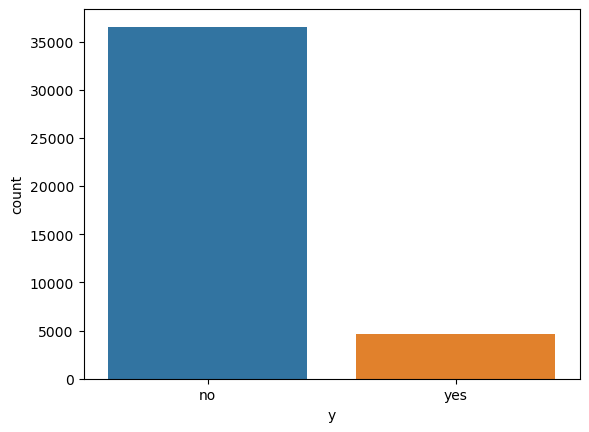

In [23]:
# check whether data is balanced or not
# data balanced: Equal number of records related to deposit or not
sns.countplot(x=data.y)

* our target variable's Data is not balence 
* means that is imbalence data

In [24]:
data.y.value_counts()

no     36548
yes     4640
Name: y, dtype: int64

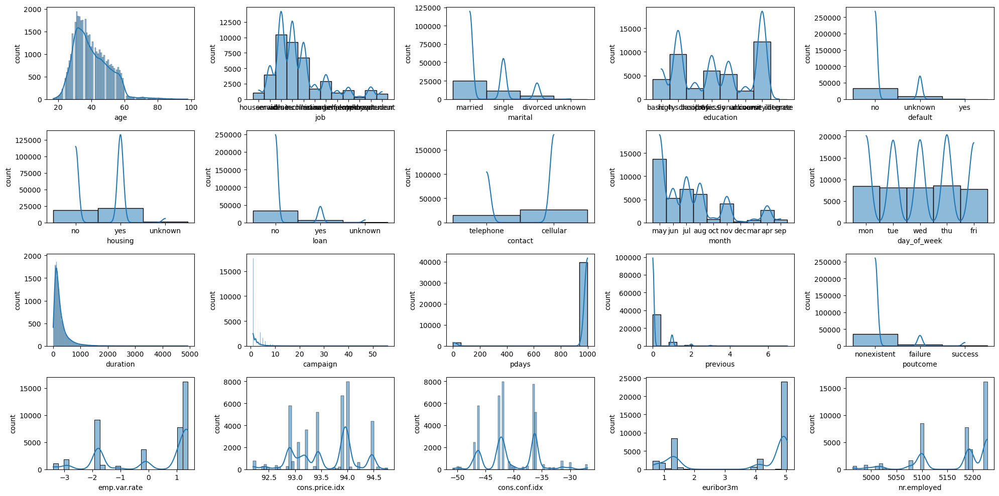

In [25]:
# check distrubution of data
plt.figure(figsize=(20,10),facecolor='white')
plotnumber=1
for column in data.drop('y',axis=1):
    if plotnumber<=22:
        ax=plt.subplot(4,5,plotnumber)
        sns.histplot(x=data[column],kde=True)
        plt.xlabel(column,fontsize=10)
        plt.ylabel("count",fontsize=10)
    plotnumber+=1
plt.tight_layout()

## Bivariate

<Axes: xlabel='duration', ylabel='count'>

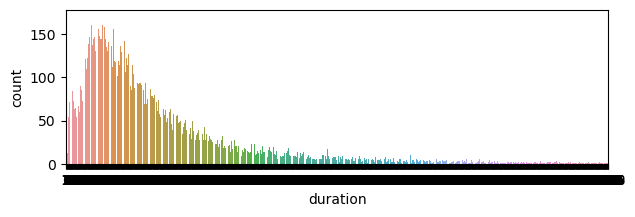

In [26]:
plt.figure(figsize=(7,2))
sns.countplot(data=data,x='duration')

* call lenght is redusing daya by day
* like skewed 

<Axes: xlabel='age', ylabel='duration'>

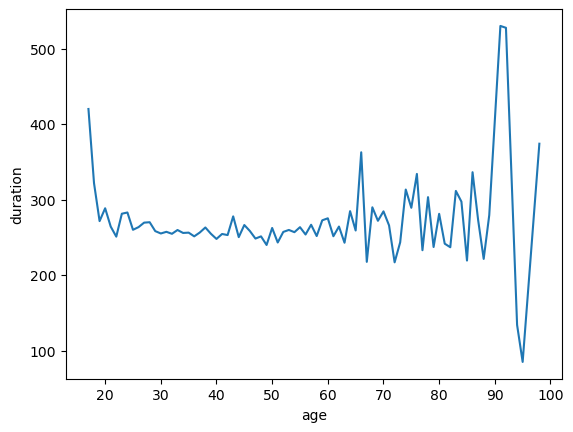

In [27]:
# line plot
sns.lineplot(data=data,x='age',y='duration',ci=None)

* Here we are comparing call duration with age

<Axes: xlabel='age', ylabel='previous'>

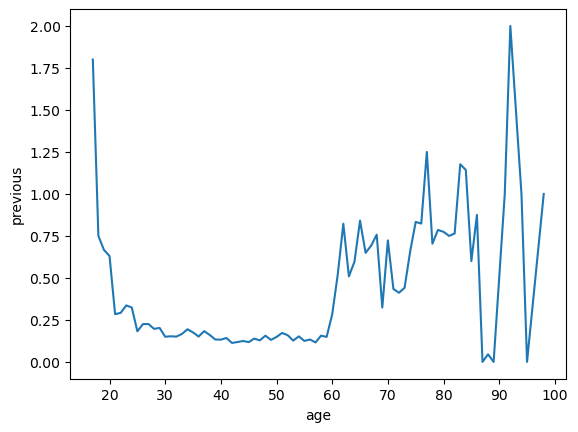

In [28]:
sns.lineplot(data=data,x='age',y='previous',ci=None,)

* Here we are comparing previous contact perform with age

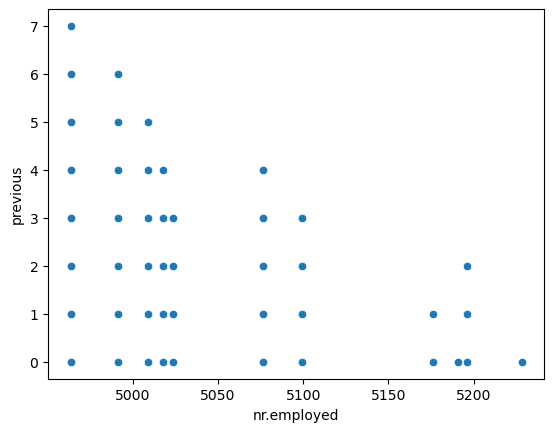

In [29]:
sns.scatterplot(data=data,x='nr.employed',y='previous')
plt.show()

* Here we are comparing previous contact with no. of employed

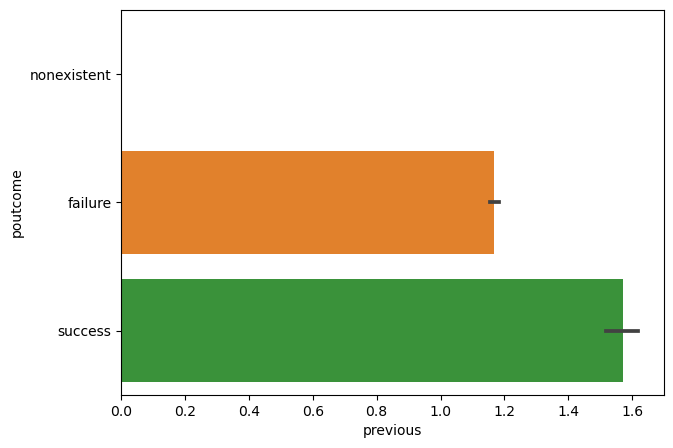

In [30]:
# bar plot
plt.figure(figsize=(7,5))
sns.barplot(data=data,x='previous',y='poutcome')
plt.show() 

* Here we are comparing poutcome(outcome of the previous marketing campaing) with previous (number of contacts performed before this campaign )

## Multivariate

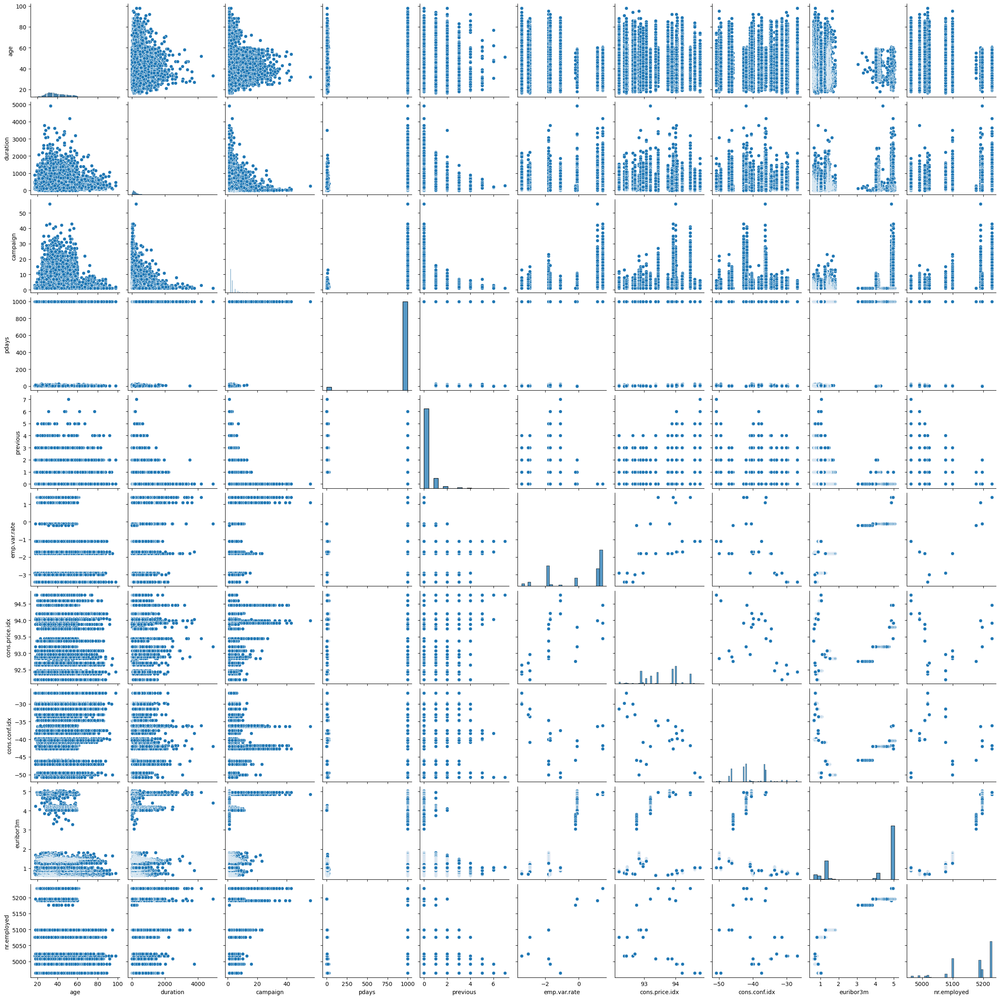

In [31]:
sns.pairplot(data=data)

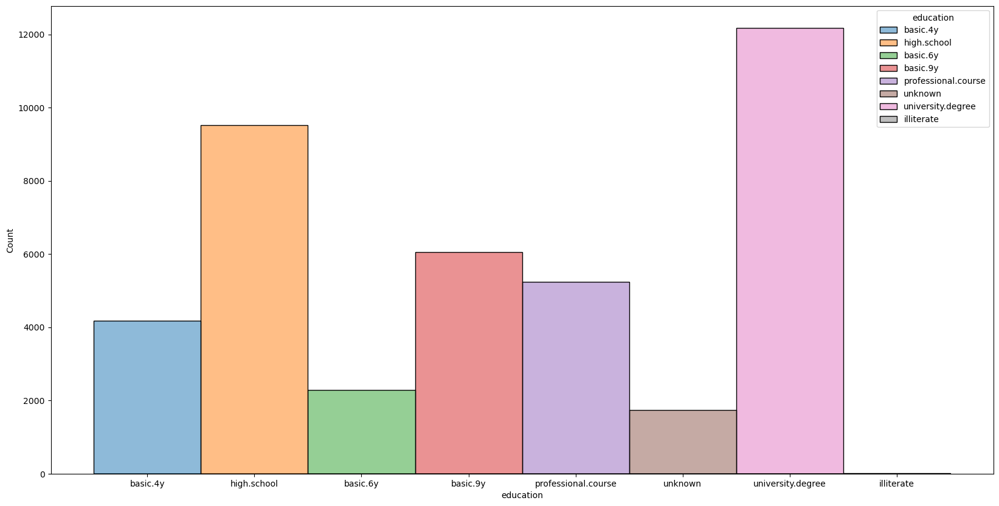

In [31]:
plt.figure(figsize=(20,10))
sns.histplot(data=data,x='education',kde=True,hue='education')
plt.show()

* Here we are seeing education column details and the  univercity degree's contact candidate are more in education column

In [53]:
# library mostly use for univariant analysis
import sweetviz as sv
my_report = sv.analyze(data)
my_report.show_html('myreport.html') # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report myreport.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


* we can apply the sweetviz library to perform exploratory data analysis (EDA) efficiently.  
* Quick Data Overview: sweetviz helps you get a quick and comprehensive overview of your dataset. It generates visualizations and statistics that summarize  data, making it easier to understand its characteristics.
* Data Comparison: You can use sweetviz to compare two datasets, such as a training dataset and a test dataset, to identify any differences or discrepancies.
* Feature Analysis: It provides insights into individual features (columns) by visualizing their distributions and statistics. This is helpful for understanding the data within each feature.
* Target Analysis: If we'll working on a classification or regression problem, sweetviz can analyze the relationship between features and the target variable, helping you identify important predictors.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
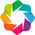

Imported v0.1.720. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
    pandas ascii encoder does not work for this file. Continuing...
    pandas utf-8 encoder does not work for this file. Continuing...
    pandas iso-8859-1 encoder does not work for this file. Continuing...
    pandas cp1252 encoder does not work for this file. Continuing...
    pandas latin1 encoder does not work for this file. Continuing...
Not able to read or load file. Please check your inputs and try again...


In [33]:
from autoviz.AutoViz_Class import AutoViz_Class
AV=AutoViz_Class()
data=AV.AutoViz(filename=" bank-addi-full_portuges.csv",verbose=2,chart_format='html')

* AutoViz is another Python library for automated and quick exploratory data analysis (EDA) and visualization. Like Sweetviz, AutoViz aims to simplify the process of understanding and visualizing your dataset. 
* Automated Visualization: AutoViz automates the process of generating a wide range of visualizations for dataset without requiring you to specify each plot manually. This saves time and effort.
* Quick Insights: It provides a rapid way to gain insights into data by creating visualizations of key features, distributions, and relationships between variables.
* Feature Selection: AutoViz can help you identify important features or columns in your dataset that may have a significant impact on your target variable.
* Visualization Variety: It generates various types of plots, including histograms, scatter plots, bar charts, and more, to cover different aspects of your data.

In [39]:
from pandas_profiling import ProfileReport
profile = ProfileReport(data, title='Portuges Bank EDA')
profile.to_file('PRCP-1000-Portuges_Bank EDA.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

* A profile report provides a comprehensive summary and analysis of a dataset, making it a valuable tool for exploratory data analysis (EDA).  
* A profile report is a document or interactive report that contains a wealth of information about a dataset. It's generated automatically and includes various statistics, visualizations, and insights to help you understand your data quickly.
* The report covers aspects such as data types, missing values, summary statistics, data distributions, correlations between variables, and more.
* Profile reports can include histograms, scatter plots, bar charts, heatmaps, and other visualizations to represent the data visually.

#### When we have to use these libraries:

   * Sweetviz: Use Sweetviz when you want a quick and straightforward visualization of a single dataframe or when you need to compare two dataframes effortlessly.
   * AutoViz: Choose AutoViz when you have a large dataset and need to automate the process of creating diverse visualizations for exploratory analysis quickly.
   * pandas-profiling: Opt for pandas-profiling when you need a comprehensive and customizable report with detailed statistics and visualizations. It's especially useful for documenting your EDA process and when you want to explore and interact with the report extensively.

# Data Preprocessing 

In [32]:
# check percentage of missing values
data.isnull().sum()/len(data)*100

age               0.0
job               0.0
marital           0.0
education         0.0
default           0.0
housing           0.0
loan              0.0
contact           0.0
month             0.0
day_of_week       0.0
duration          0.0
campaign          0.0
pdays             0.0
previous          0.0
poutcome          0.0
emp.var.rate      0.0
cons.price.idx    0.0
cons.conf.idx     0.0
euribor3m         0.0
nr.employed       0.0
y                 0.0
dtype: float64

In [33]:
data.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

* The data is complete and doesn't contain any missing information in the columns

In [34]:
print(data.mean())
print(data.median())
print(data.mode())

age                 40.024060
duration           258.285010
campaign             2.567593
pdays              962.475454
previous             0.172963
emp.var.rate         0.081886
cons.price.idx      93.575664
cons.conf.idx      -40.502600
euribor3m            3.621291
nr.employed       5167.035911
dtype: float64
age                 38.000
duration           180.000
campaign             2.000
pdays              999.000
previous             0.000
emp.var.rate         1.100
cons.price.idx      93.749
cons.conf.idx      -41.800
euribor3m            4.857
nr.employed       5191.000
dtype: float64
    age     job  marital          education default housing loan   contact  \
0  31.0  admin.  married  university.degree      no     yes   no  cellular   
1   NaN     NaN      NaN                NaN     NaN     NaN  NaN       NaN   

  month day_of_week  ...  campaign  pdays  previous     poutcome emp.var.rate  \
0   may         thu  ...       1.0  999.0       0.0  nonexistent          1.4   
1  

In [35]:
data.corr()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
age,1.000000,-0.000866,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725
duration,-0.000866,1.000000,-0.071699,-0.047577,0.020640,-0.027968,0.005312,-0.008173,-0.032897,-0.044703
campaign,0.004594,-0.071699,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095
pdays,-0.034369,-0.047577,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605
previous,0.024365,0.020640,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333
emp.var.rate,-0.000371,-0.027968,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970
cons.price.idx,0.000857,0.005312,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034
cons.conf.idx,0.129372,-0.008173,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513
euribor3m,0.010767,-0.032897,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154
nr.employed,-0.017725,-0.044703,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000


In [36]:
data.nunique()

age                 78
job                 12
marital              4
education            8
default              3
housing              3
loan                 3
contact              2
month               10
day_of_week          5
duration          1544
campaign            42
pdays               27
previous             8
poutcome             3
emp.var.rate        10
cons.price.idx      26
cons.conf.idx       26
euribor3m          316
nr.employed         11
y                    2
dtype: int64

## Check Outliers 

In [37]:
# after encoding

## Data Encoding- Convert categorical to Numerical

In [38]:
print(data.dtypes,data.nunique())

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object age                 78
job                 12
marital              4
education            8
default              3
housing              3
loan                 3
contact              2
month               10
day_of_week          5
duration          1544
campaign            42
pdays               27
previous             8
poutcome             3
emp.var.rate        10
cons.price.idx      26
cons.conf.idx       26
euribor3m          316
nr.

In [39]:
df = pd.DataFrame(data)

# Filter columns with object (string) data type
object_columns = df.select_dtypes(include=['object'])

# Iterate through object columns and print unique values
for column in object_columns.columns:
    unique_values = df[column].unique()
    print(f"Unique values in column '{column}': {', '.join(unique_values)}")

Unique values in column 'job': housemaid, services, admin., blue-collar, technician, retired, management, unemployed, self-employed, unknown, entrepreneur, student
Unique values in column 'marital': married, single, divorced, unknown
Unique values in column 'education': basic.4y, high.school, basic.6y, basic.9y, professional.course, unknown, university.degree, illiterate
Unique values in column 'default': no, unknown, yes
Unique values in column 'housing': no, yes, unknown
Unique values in column 'loan': no, yes, unknown
Unique values in column 'contact': telephone, cellular
Unique values in column 'month': may, jun, jul, aug, oct, nov, dec, mar, apr, sep
Unique values in column 'day_of_week': mon, tue, wed, thu, fri
Unique values in column 'poutcome': nonexistent, failure, success
Unique values in column 'y': no, yes


* In object columns have that type of value in object form

In [40]:
data.education.unique()

array(['basic.4y', 'high.school', 'basic.6y', 'basic.9y',
       'professional.course', 'unknown', 'university.degree',
       'illiterate'], dtype=object)

In [41]:
## data encoding 
#Convert categorical y column into numerical using lable encoding

from sklearn.preprocessing import LabelEncoder#importing label encoder from sklearn 

label = LabelEncoder()#object creation 
data.y=label.fit_transform(data.y)#applying label encoder to  y 

In [42]:
data

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1


In [43]:
# Convert categorical variables into numerical using one-hot encoding
data_encoded= pd.get_dummies(data, columns=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'poutcome'])

In [44]:
data_encoded

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0


In [45]:
# Now we are trying to save these to diffrent name file.
data_encoded.to_csv('DummiesFile.csv', index=False)

In [46]:
# Loading dataset
data1=pd.read_csv('DummiesFile.csv')

In [47]:
data1.shape

(41188, 58)

In [48]:
data1

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,1,0,0,0,0,0,1,0


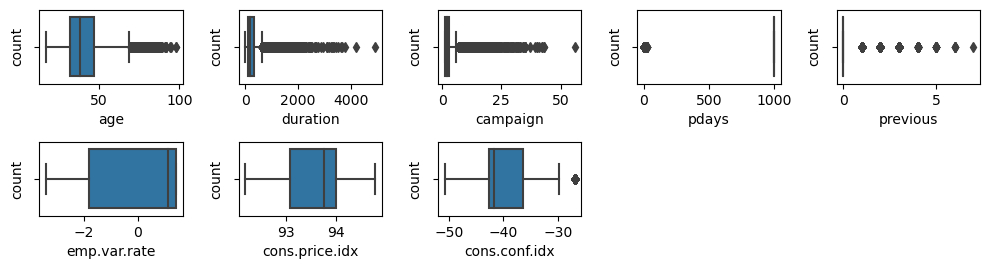

In [49]:
 # checking Outliers 
plt.figure(figsize=(10,5),facecolor='white')
plotnumber=1
for column in data1.drop('y',axis=1):
    if plotnumber<9:
        ax=plt.subplot(4,5,plotnumber)
        sns.boxplot(x=data1[column])
        plt.xlabel(column,fontsize=10)
        plt.ylabel("count",fontsize=10)
    plotnumber+=1
plt.tight_layout()


## Scaling data [ Normalization or standardization]

* why we use this becouse data does not contain significant outliers

In [50]:
# Min max scaler
from sklearn.preprocessing import MinMaxScaler
scaling=MinMaxScaler()
data1.iloc[:,:-1]=scaling.fit_transform(data1.iloc[:,:-1])


# Feture Selection

In [51]:
 data1.corr()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
age,1.000000,-0.000866,0.004594,-0.034369,0.024365,-0.000371,0.000857,0.129372,0.010767,-0.017725,...,0.053008,0.040889,0.007148,0.019027,-0.021356,0.019137,-0.023671,-0.002537,-0.016376,0.035626
duration,-0.000866,1.000000,-0.071699,-0.047577,0.020640,-0.027968,0.005312,-0.008173,-0.032897,-0.044703,...,0.015454,0.018011,-0.010343,-0.023068,0.014666,0.004140,0.014537,-0.013311,-0.011665,0.044876
campaign,0.004594,-0.071699,1.000000,0.052584,-0.079141,0.150754,0.127836,-0.013733,0.135133,0.144095,...,-0.049126,-0.033953,0.026641,0.014405,0.005141,-0.025125,-0.021088,-0.068890,0.087645,-0.050893
pdays,-0.034369,-0.047577,0.052584,1.000000,-0.587514,0.271004,0.078889,-0.091342,0.296899,0.372605,...,-0.128677,-0.154629,0.013782,0.001031,-0.008186,-0.007300,0.001021,0.006354,0.491353,-0.950700
previous,0.024365,0.020640,-0.079141,-0.587514,1.000000,-0.420489,-0.203130,-0.050936,-0.454494,-0.501333,...,0.127754,0.157651,0.004404,-0.002012,0.001512,0.000090,-0.003929,0.682608,-0.878776,0.524045
emp.var.rate,-0.000371,-0.027968,0.150754,0.271004,-0.420489,1.000000,0.775334,0.196041,0.972245,0.906970,...,-0.213706,-0.170366,-0.015277,-0.018139,-0.007673,0.014582,0.026797,-0.381706,0.472501,-0.256886
cons.price.idx,0.000857,0.005312,0.127836,0.078889,-0.203130,0.775334,1.000000,0.058986,0.688230,0.522034,...,-0.092174,-0.046905,0.002569,0.001273,-0.017143,0.001216,0.012479,-0.297718,0.304264,-0.077416
cons.conf.idx,0.129372,-0.008173,-0.013733,-0.091342,-0.050936,0.196041,0.058986,1.000000,0.277686,0.100513,...,0.170425,0.169175,-0.003104,-0.041382,-0.027877,0.050033,0.023711,-0.162592,0.099724,0.084824
euribor3m,0.010767,-0.032897,0.135133,0.296899,-0.454494,0.972245,0.688230,0.277686,1.000000,0.945154,...,-0.185937,-0.190321,-0.015371,-0.023279,-0.013757,0.022732,0.030201,-0.385417,0.488406,-0.281022
nr.employed,-0.017725,-0.044703,0.144095,0.372605,-0.501333,0.906970,0.522034,0.100513,0.945154,1.000000,...,-0.273236,-0.292156,-0.012913,-0.017433,-0.002658,0.009923,0.023272,-0.349602,0.493051,-0.350613


In [53]:
plt.figure(figsize=(130,90))
sns.heatmap(data1.drop('y',axis=1).corr(),annot=True)

<Axes: >

# Model Creation

In [54]:
data1

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
0,0.481481,0.053070,0.000000,1.0,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0
1,0.493827,0.030297,0.000000,1.0,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0
2,0.246914,0.045954,0.000000,1.0,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0
3,0.283951,0.030704,0.000000,1.0,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0
4,0.481481,0.062424,0.000000,1.0,0.000000,0.937500,0.698753,0.60251,0.957379,0.859735,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,0.691358,0.067914,0.000000,1.0,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
41184,0.358025,0.077877,0.000000,1.0,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
41185,0.481481,0.038430,0.018182,1.0,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
41186,0.333333,0.089874,0.000000,1.0,0.000000,0.479167,1.000000,0.00000,0.089322,0.000000,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0


In [55]:
 # creating data into x and y
x=data1.drop('y',axis=1)
y=data1[['y']]

In [56]:
 # creating data for training and testing
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=2)

In [57]:
x_train.shape 

(28831, 57)

In [58]:
x_test.shape

(12357, 57)

In [59]:
data1.shape

(41188, 58)

# Apply Logistic Regression 

In [60]:
# import Logistic regression model
from sklearn.linear_model import LogisticRegression
# initialize the model
LogisticReg=LogisticRegression()
# train model with x_train,y_train
LogisticReg.fit(x_train,y_train)

LogisticRegression()

In [61]:
# make predictions using x_test
y_pred=LogisticReg.predict(x_test)
y_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [62]:
df=y_test.copy()

In [63]:
df['y_pred']=y_pred

In [64]:
df.y_pred.value_counts()

0.0    10954
1.0     1403
Name: y_pred, dtype: int64

In [65]:
 len(df)

12357

## Evaluation the Model

In [66]:
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,f1_score,classification_report

In [67]:
confusion_matrix(y_test,y_pred) #TN FP FN TP

array([[10954,     0],
       [    0,  1403]], dtype=int64)

In [68]:
LogisticR_score=accuracy_score(y_test,y_pred)
LogisticR_score

1.0

In [69]:
precision_score(y_test,y_pred)

1.0

In [70]:
recall_score(y_test,y_pred)

1.0

In [71]:
f1_score(y_test,y_pred)

1.0

In [72]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     10954
         1.0       1.00      1.00      1.00      1403

    accuracy                           1.00     12357
   macro avg       1.00      1.00      1.00     12357
weighted avg       1.00      1.00      1.00     12357



In [73]:
print("The Accuracy score we achive using logistic regression is :",LogisticR_score)

The Accuracy score we achive using logistic regression is : 1.0


# Apply Gradient Boosting Algorithm 

### what is Gradient Boosting ?

Gradient boosting is a type of machine learning boosting. It relies on the intuition that the best possible next model, when combined with previous models, minimizes the overall prediction error. The key idea is to set the target outcomes for this next model in order to minimize the error



In [74]:
## importing the model library
from sklearn.ensemble import GradientBoostingClassifier
GradientB=GradientBoostingClassifier() ## object creation
GradientB.fit(x_train,y_train) ## fitting the data
y_gbm=GradientB.predict(x_test)#predicting the price


In [75]:
## evaluatin the model
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,classification_report# to check model performance
GradientB_score=accuracy_score(y_test,y_gbm)
GradientB_score

1.0

In [76]:
# someone told me if Model got 1.0 accuracy That means model has made correct predictions

In [77]:
print("The Accuracy score we achive using gradient bossting is :",GradientB_score)

The Accuracy score we achive using gradient bossting is : 1.0


# XG-Boost Algorithm

In [78]:
## model creation
from xgboost import XGBClassifier#importing the model library
XGBoost=XGBClassifier() ## object creation
XGBoost.fit(x_train,y_train)# fitting the data
y_hat=XGBoost.predict(x_test)#predicting the price

In [79]:
 accuracy_score(y_test,y_hat)

1.0

## Hyperparameter Tunning for XGBoost

In [80]:
 from sklearn.model_selection import RandomizedSearchCV

param_grid = {'gamma': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4, 200],
              'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.15, 0.2, 0.25, 0.300000012, 0.4, 0.5, 0.6, 0.7],
              'max_depth': [5,6,7,8,9,10,11,12,13,14],
              'n_estimators': [50,65,80,100,115,130,150],
              'reg_alpha': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200],
              'reg_lambda': [0,0.1,0.2,0.4,0.8,1.6,3.2,6.4,12.8,25.6,51.2,102.4,200]}

XGB=XGBClassifier(random_state=42,verbosity=0,silent=0)
rcv= RandomizedSearchCV(estimator=XGB, scoring='f1',param_distributions=param_grid, n_iter=100, cv=3, 
                               verbose=2, random_state=42, n_jobs=-1)
                               
 
                        
rcv.fit(x_train, y_train)##training data on randomsearch cv
cv_best_params = rcv.best_params_##it will give you best parameters 
print(f"Best paramters: {cv_best_params})")##printing  best parameters

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'reg_lambda': 1.6, 'reg_alpha': 12.8, 'n_estimators': 50, 'max_depth': 8, 'learning_rate': 0.6, 'gamma': 0})


In [81]:
XGB2=XGBClassifier(reg_lambda= 0.1, reg_alpha= 12.8, n_estimators=100, max_depth=8,
                   learning_rate=0.300000012, gamma=0.8)
XGB2.fit(x_train, y_train)#training 
y_predict=XGB2.predict(x_test)#testing


In [82]:
 y_train_pred=XGB2.predict(x_train)

In [83]:
XG_Boost_score=accuracy_score(y_test,y_predict)
XG_Boost_score

1.0

In [84]:
 unique_values, counts = np.unique(y_train_pred, return_counts=True)
print(unique_values)
print(counts)

[0 1]
[25594  3237]


In [85]:
 unique_values, counts = np.unique(accuracy_score(y_test,y_predict), return_counts=True)
print(unique_values)
print(counts)

[1.]
[1]


In [86]:
print("The Accuracy score we achive using XG_Boost is :",XG_Boost_score)

The Accuracy score we achive using XG_Boost is : 1.0


#  Apply Decision Tree

In [87]:
## Balacing the data
# SMOTE (Synthetic Minority Over-sampling Technique) is a technique used to address class imbalance in machine learning datasets. It's commonly applied to classification problems where one class (the minority class) is significantly underrepresented compared to another class (the majority class).
from collections import Counter# importing counter to check count of each label
from imblearn.over_sampling import SMOTE #for balancing the data
sm=SMOTE()
x_smote,y_smote=sm.fit_resample(x_train,y_train)

In [88]:
print("actual",Counter(y_train))
print("after smote",Counter(y_smote))

actual Counter({'y': 1})
after smote Counter({'y': 1})


In [89]:
# creating decision tree model
from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier() # model 
dtree.fit(x_smote,y_smote)
y_predic=dtree.predict(x_test)

In [90]:
y_train_predict=dtree.predict(x_train)#predicting training data to check training performance 
y_train_predict

array([0., 0., 0., ..., 0., 0., 0.])

In [91]:
decisiontree=accuracy_score(y_train,y_train_predict)
decisiontree

1.0

In [92]:
print("The Accuracy score we achive using decision tree algorithm is :",decisiontree)

The Accuracy score we achive using decision tree algorithm is : 1.0


# Apply Random Forest 

In [93]:
# creating
from sklearn.ensemble import RandomForestClassifier
RForest=RandomForestClassifier()
RForest.fit(x_smote,y_smote)
y_pred=RForest.predict(x_test)

In [94]:
accuracy_score(y_test,y_pred)

1.0

## Hyperparameter Tunning for Random Forest

In [95]:
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False] 

In [96]:
#dictionary for hyperparameters
random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf1 = RandomForestClassifier(random_state=42)#model

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='accuracy',
                           param_distributions=random_grid, n_iter=100, cv=3, 
                               verbose=2, random_state=42, n_jobs=-1)
rf_cv.fit(x_smote, y_smote)
rf_best_params = rf_cv.best_params_
print(f"Best paramters: {rf_best_params})")
 

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best paramters: {'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True})


In [97]:
rf_clf2 = RandomForestClassifier(n_estimators= 100, min_samples_split=2, min_samples_leaf= 1, max_features='auto', max_depth=20, bootstrap=False)#passing best parameter to randomforest
rf_clf2.fit(x_smote,y_smote)
y_predict=rf_clf2.predict(x_test)


In [98]:
# training accuracy
y_train_pred=rf_clf2.predict(x_train)

In [99]:
# testing accuracy
randomforest=accuracy_score(y_test,y_predict)
randomforest

1.0

In [100]:
# training accuracy
accuracy_score(y_train,y_train_pred)

1.0

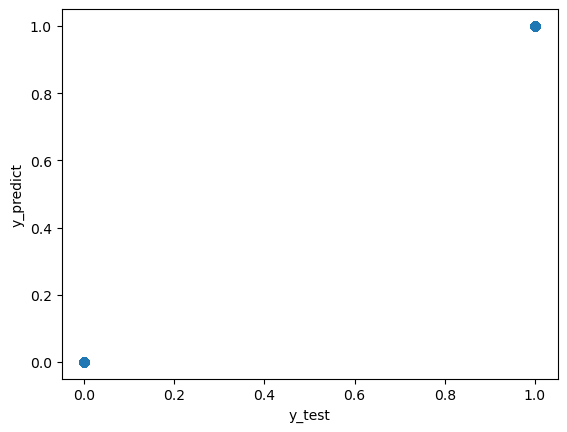

In [106]:
plt.scatter(y_test, y_predict, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_predict")
plt.show()

In [107]:
print("The Accuracy score we achive using random forest is :",randomforest)

The Accuracy score we achive using random forest is : 1.0


# Apply KNeighbors

In [108]:
# Import KNN algorithm
from sklearn.neighbors import KNeighborsClassifier
# Create empty list to store error values
error_rate = []

for i in range(1, 11):
    KNN = KNeighborsClassifier(n_neighbors=i)
    KNN.fit(x_train, y_train)
    y_pred = KNN.predict(x_test)
    
    # Convert y_test to Series and then apply .ravel()
    error_rate.append(np.mean(y_pred != y_test.iloc[:, 0].ravel()))  # Assuming the target column is the first column

error_rate

[0.01432386501578053,
 0.02573440155377519,
 0.011491462329044267,
 0.018370154568260903,
 0.013190903941086024,
 0.01950311564295541,
 0.015456826090475034,
 0.020069596180302664,
 0.015618677672574249,
 0.019907744598203447]

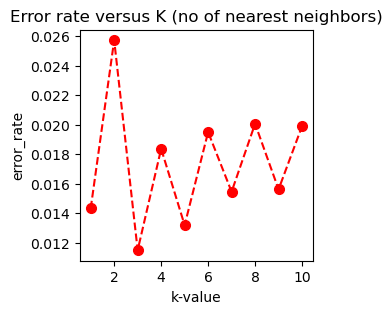

In [118]:
plt.figure(figsize=(3,3))
plt.plot(range(1,11),error_rate,color="red",linestyle="dashed",marker='o',markersize=7)
plt.title("Error rate versus K (no of nearest neighbors)")
plt.xlabel("k-value")
plt.ylabel("error_rate")
plt.show()

### 3 K-value Give less error

In [119]:
knn_model=KNeighborsClassifier(n_neighbors=7)
knn_model.fit(x_train,y_train)
y_pred=knn_model.predict(x_test)

In [120]:
# accuracy score
KNN_score=accuracy_score(y_test,y_pred)
KNN_score

0.984543173909525

In [121]:
print("The Accuracy score we achive using K-Neighbors is :",KNN_score)

The Accuracy score we achive using K-Neighbors is : 0.984543173909525


# Using Deep Learning

In [122]:
## Scaling the data as the magnitude of variables are varying lot
from sklearn.preprocessing import StandardScaler
sc=StandardScaler() ## object creation
sclaed_x=sc.fit_transform(x) ## transforming the data
X = pd.DataFrame(sclaed_x,columns=x.columns) ##converting the arrays
## to dataframe

# ANN (Artificial Neural Network)

In [123]:
## model creation
from sklearn.neural_network import MLPClassifier
ANN = MLPClassifier( hidden_layer_sizes=(50,3),
                       learning_rate_init=0.1,
                       max_iter=100,
                       random_state=2) ## model object creation max_iter=Stopping parameter
ANN.fit(x_train,y_train) ## training the data
y_predict_proba = ANN.predict_proba(x_test) ## predicting the pro
## bability of class
y_predict = ANN.predict(x_test)
y_train_predict = ANN.predict(x_train)

In [124]:
y_train_predict

array([0., 0., 0., ..., 0., 0., 0.])

In [125]:
## Evaluating the model created
from sklearn.metrics import accuracy_score,confusion_matrix
print("Train accuracy :",accuracy_score(y_train,y_train_predict))
ANN_score=accuracy_score(y_test,y_predict)
print("Test accuracy :",ANN_score)

Train accuracy : 0.8877250182095661
Test accuracy : 0.8864611151574007


In [126]:
## getting the confusion matrix
confusion = confusion_matrix(y_test, y_predict)

print(confusion)

[[10954     0]
 [ 1403     0]]


In [127]:
print("The Accuracy score we achive using artificial nural network is :",ANN_score)

The Accuracy score we achive using artificial nural network is : 0.8864611151574007


# Conclusion

In [128]:
accuracy_scores = [LogisticR_score,GradientB_score,XG_Boost_score,decisiontree,randomforest,KNN_score,ANN_score]
algorithms = ["Logistic Regression","Gradient Boosting","XG-Boost","Decision Tree","Random Forest","K-Nearest Neighbors","Artificial Nueral Network"]    

for i in range(len(algorithms)):
    print("The accuracy score achieved using "+algorithms[i]+" is: "+str(accuracy_scores[i])+" %")

The accuracy score achieved using Logistic Regression is: 1.0 %
The accuracy score achieved using Gradient Boosting is: 1.0 %
The accuracy score achieved using XG-Boost is: 1.0 %
The accuracy score achieved using Decision Tree is: 1.0 %
The accuracy score achieved using Random Forest is: 1.0 %
The accuracy score achieved using K-Nearest Neighbors is: 0.984543173909525 %
The accuracy score achieved using Artificial Nueral Network is: 0.8864611151574007 %


<Axes: xlabel='Algorithms', ylabel='Accuracy score'>

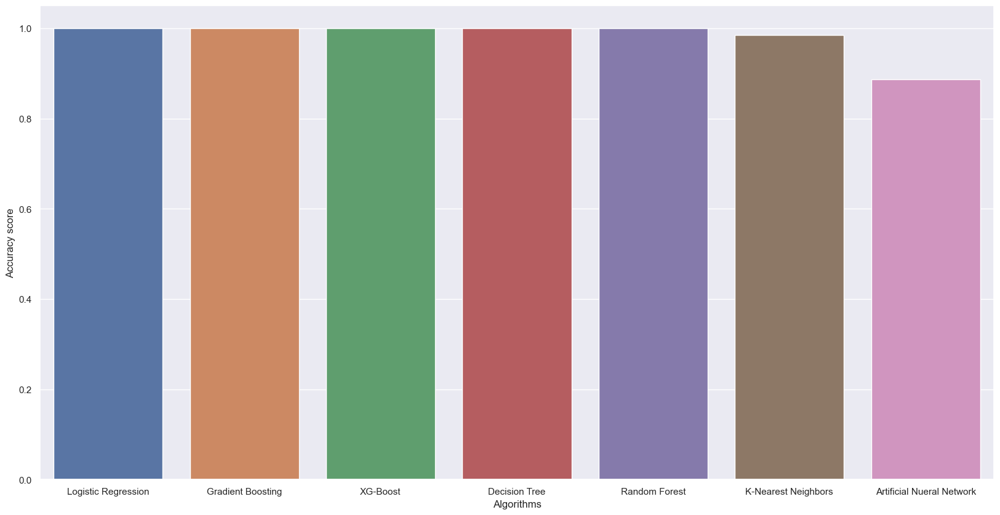

In [129]:
sns.set(rc={'figure.figsize':(20,10)})
plt.xlabel("Algorithms")
plt.ylabel("Accuracy score")

sns.barplot(x=algorithms,y=accuracy_scores)

* Within all the six models four model gives more accuracy score followed closely by K-Nearest Neighbors and ANN
* While ANN had the lowest performance.
* ie; Here the best model is 
   * 1.Logistic Regression
                            
  * 2.Gradient Boosting
  * 3.XG-Boost 
  * 4.Decision Tree
  * 5.Random Forest


# The model Deployment Technique 

In [193]:
#!pip install joblib otherwise pickle

In [104]:
import joblib

# Create a dictionary to store the models
models = {
    'logistic_Regression': LogisticReg,
    'gradient_boosting_Classifier': GradientB,
    'XGBClassifier':XGB2,
    'decision_tree': dtree,
    'RandomForestClassifier-Hyper':rf_clf2,
    'K-Nearest Neighbors': knn_model,
    'Artificial Nueral Network': ANN
}

# Save the dictionary of models to a single pickle file
joblib.dump(models, 'all_modelsMJ.pkl')

['all_modelsMJ.pkl']

In [108]:
# Load the dictionary of models from the pickle file
loaded_models = joblib.load('all_modelsMJ.pkl')

# Access individual models as needed
logistic_regression_model = loaded_models['LogisticReg']
#gradient_boosting_model = loaded_models['gradient_boosting']
# ... and so on
